# Object Training

### Defintion for Model

In [0]:
num_steps = 1000
num_eval_steps = 50
MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v3_small_coco_2019_08_14',
        'pipeline_file': 'ssdlite_mobilenet_v3_small_320x320_coco.config',
        'batch_size': 12
    }
}

# Pick the model you want to use
# Select a model in `MODELS_CONFIG`.
selected_model = 'ssd_mobilenet_v2'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colabe's Tesla K80 GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

In [0]:
test_record_fname = '/content/drive/My Drive/object-detection/val-v2.record'  #Test record file , from object training
train_record_fname = '/content/drive/My Drive/object-detection/train-v2.record' #Train record file , from object training
label_map_pbtxt_fname = '/content/drive/My Drive/object-detection/labelmap.pbtxt' #Label map file

In [0]:
import os
DEST_DIR = 'ssd_mobilenet_v3_small_coco_2019_08_14'
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

'ssd_mobilenet_v3_small_coco_2019_08_14/model.ckpt'

In [0]:
pipeline_file

'ssdlite_mobilenet_v3_small_320x320_coco.config'

In [0]:
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git

!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib

!pip install -q pycocotools

%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.

import os
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/'

!python object_detection/builders/model_builder_test.py

/content
Selecting previously unselected package python-bs4.
(Reading database ... 144542 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpa

In [0]:
!wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v3_small_coco_2019_08_14.tar.gz

--2020-03-20 08:59:54--  http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v3_small_coco_2019_08_14.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.140.128, 2a00:1450:400c:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.140.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35910144 (34M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v3_small_coco_2019_08_14.tar.gz’

ssd_mobilenet_v3_sm 100%[===================>]  34.25M  49.8MB/s    in 0.7s    

2020-03-20 08:59:56 (49.8 MB/s) - ‘ssd_mobilenet_v3_small_coco_2019_08_14.tar.gz’ saved [35910144/35910144]



In [0]:
fine_tune_checkpoint = !tar -xf ssd_mobilenet_v3_small_coco_2019_08_14.tar.gz

In [0]:
import os
pipeline_fname = os.path.join('object_detection/samples/configs/', pipeline_file)

assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

In [0]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

In [0]:
num_classes = get_num_classes(label_map_pbtxt_fname)
num_classes

2

In [0]:
!git clone thehetpandya:8520Pandya@@github.com/Shubhaminferenz/ocr_machinevision.git

In [0]:
fine_tune_checkpoint

'ssd_mobilenet_v3_small_coco_2019_08_14/model.ckpt'

In [0]:
import re
with open(pipeline_fname) as f:
    s = f.read()
# with open(pipeline_fname, 'w') as f:
#     # tfrecord files train and test.
#     s = re.sub(
#         '(input_path: ".*?)(train.record)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
#     s = re.sub(
#         '(input_path: ".*?)(val.record)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

#     # label_map_path
#     s = re.sub(
#         'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

#     # Set training batch_size.
#     s = re.sub('batch_size: [0-9]+',
#                'batch_size: {}'.format(batch_size), s)

#     # Set training steps, num_steps
#     s = re.sub('num_steps: [0-9]+',
#                'num_steps: {}'.format(num_steps), s)
    
#     # Set number of classes num_classes.
#     s = re.sub('num_classes: [0-9]+',
#                'num_classes: {}'.format(num_classes), s)
#     f.write(s)
# with open(pipeline_fname) as f:
#     s = f.read()
print(s)

# SSDLite with Mobilenet v3 small feature extractor.
# Trained on COCO14, initialized from scratch.
# TPU-compatible.
# Users should configure the fine_tune_checkpoint field in the train config as
# well as the label_map_path and input_path fields in the train_input_reader and
# eval_input_reader. Search for "PATH_TO_BE_CONFIGURED" to find the fields that
# should be configured.

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 2
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: tru

In [0]:
model_dir = 'training/'
# Optionally remove content in output model directory to fresh start.
os.makedirs(model_dir, exist_ok=True)

In [0]:
pipeline_fname

In [0]:
!python object_detection/model_main.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir=/content/drive/My\ Drive/object-detection/training \
    --alsologtostderr \
    --num_train_steps=8000 \
    --num_eval_steps={num_eval_steps}

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



W0318 05:50:18.240373 139792586819456 module_wrapper.py:139] From /content/models/research/object_detection/utils/config_util.py:102: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0318 05:50:18.244484 139792586819456 module_wrapper.py:139] From /content/models/research/object_detection/model_lib.py:628: The name tf.logging.warning is deprecated. Please use tf.compat.v1.logging.warning instead.

W0318 05:50:18.244663 139792586819456 model_lib.py:629] Forced number of epochs for all eval validations to be 1.

W0318 05:50:18.244806 139792586819456 module_wrapper.py:139] From /content/models/resea

In [0]:
!cp -r /content/drive/My\ Drive/object-detection/training /content/models/research/

In [0]:
!cp -r /content/drive/My\ Drive/object-detection/test/* /content/models/research/train

In [0]:
!ls {model_dir}

checkpoint
events.out.tfevents.1584609664.ac865fccd44b
events.out.tfevents.1584610430.ac865fccd44b
events.out.tfevents.1584611549.ac865fccd44b
events.out.tfevents.1584612298.ac865fccd44b
events.out.tfevents.1584613063.ac865fccd44b
events.out.tfevents.1584613792.ac865fccd44b
graph.pbtxt
model.ckpt-2371.data-00000-of-00001
model.ckpt-2371.index
model.ckpt-2371.meta
model.ckpt-3600.data-00000-of-00001
model.ckpt-3600.index
model.ckpt-3600.meta
model.ckpt-4857.data-00000-of-00001
model.ckpt-4857.index
model.ckpt-4857.meta
model.ckpt-6111.data-00000-of-00001
model.ckpt-6111.index
model.ckpt-6111.meta
model.ckpt-7363.data-00000-of-00001
model.ckpt-7363.index
model.ckpt-7363.meta


In [0]:
import re
import numpy as np

output_directory = './fine_tuned_model'

lst = os.listdir(model_dir)
lst = [l for l in lst if 'model.ckpt-' in l and '.meta' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()].replace('.meta', '')

last_model_path = os.path.join(model_dir, last_model)
print(last_model_path)
!python /content/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path={pipeline_fname} \
    --output_directory={output_directory} \
    --trained_checkpoint_prefix={last_model_path}

In [0]:
!python3 object_detection/export_tflite_ssd_graph.py \
  --pipeline_config_path={pipeline_fname} \
  --trained_checkpoint_prefix={last_model_path} \
  --output_directory=/content/models/research/tflite \
  --add_postprocessing_op=true

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



W0320 09:07:05.602397 140644255979392 module_wrapper.py:139] From object_detection/export_tflite_ssd_graph.py:133: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0320 09:07:05.606497 140644255979392 module_wrapper.py:139] From /content/models/research/object_detection/export_tflite_ssd_graph_lib.py:193: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0320 09:07:05.606909 140644255979392 module_wrapper.py:139] From /content/models/research/object_detection/export_tflite_ssd_graph_lib.py:237: The name tf.placeholder is deprecated. Please use tf.compat.v1.plac

In [0]:
!tflite_convert \
--graph_def_file=/content/models/research/tflite/tflite_graph.pb \
--output_file=/content/models/research/tflite/model.tflite \
--output_format=TFLITE \
--input_arrays=normalized_input_image_tensor \
--input_shapes=1,320,320,3 \
--inference_type=FLOAT \
--output_arrays="TFLite_Detection_PostProcess,TFLite_Detection_PostProcess:1,TFLite_Detection_PostProcess:2,TFLite_Detection_PostProcess:3" \
--allow_custom_ops

2020-03-20 09:07:27.713486: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-03-20 09:07:27.730650: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-03-20 09:07:27.731404: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla K80 major: 3 minor: 7 memoryClockRate(GHz): 0.8235
pciBusID: 0000:00:04.0
2020-03-20 09:07:27.731656: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-03-20 09:07:27.733491: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2020-03-20 09:07:27.735203: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10
20

In [0]:
output_directory

'./fine_tuned_model'

In [0]:
import glob
import os

pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = pb_fname

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = label_map_pbtxt_fname

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
PATH_TO_TEST_IMAGES_DIR =  os.path.join("train")

assert os.path.isfile(pb_fname)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

['train/f764c7cd-797b-4024-8cce-c95c21871438.jpg', 'train/mcc dhoe.jpg', 'train/harish bhune.jpg', 'train/edb017bb-ae6a-419d-b38b-6292a821bb1e.jpg', 'train/lacto anand.jpg', 'train/lakhan k peeda 2.jpg', 'train/fcc6db45-3e8a-44f5-ac10-5c8f41a8dd3b.jpg', 'train/f35bae69-6b03-43c9-a53e-b1b1716d4a6c.jpg', 'train/meilo 3.jpg', 'train/jalan 3.jpg', 'train/edadbbf3-3a8d-4a12-b6ef-c948c950431e.jpg', 'train/f51c7db3-0154-461e-ab6f-7de19760ceed.jpg', 'train/fa452e44-8c19-41e2-a769-7eaf4233ceea.jpg', 'train/ed239122-f1f1-4fe7-a0e3-8fc6166e261c.jpg', 'train/f9f40a2e-465d-4d04-b8c9-ebf57c5c6a3f.jpg', 'train/lakhan k peeda 1.jpg', 'train/f5731846-ce2c-42d5-91e6-fc9faaa170a3.jpg', 'train/ef2577a2-e64f-4a8c-b8ab-b220b09db158.jpg', 'train/f51677eb-0a6c-414e-a9f5-f18f357f23e3.jpg', 'train/melo ki dhani.jpg', 'train/meilo 2.jpg', 'train/f124c728-aab4-4c56-abb1-056c703e77ae.jpg', 'train/mcc dhodhe 2.jpg', 'train/f68958ba-076c-40b6-84d1-6388ffd0c333.jpg', 'train/mcc 3.jpg', 'train/fa22317a-7051-44c3-b925-

In [0]:
cd ..

In [0]:
# %cd /content/models/research/object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops


# This is needed to display the images.
%matplotlib inline


from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util


detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')


label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(
    label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (16, 12)


def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,
                                   feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(
                output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
                'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict


for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    print(category_index)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=8)
    plt.figure(figsize=IMAGE_SIZE)
    plt.imshow(image_np)

In [0]:
import os

pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)

In [0]:
classNames = { 1: 'lcd',2: 'qr' }

0.7029983997344971
0.5343188643455505
0.4474324584007263
0.4252598285675049
0.40062806010246277
0.338729590177536
0.3341352343559265
0.32967713475227356
0.3048650324344635
0.29803937673568726
0.29659852385520935
0.2779739797115326
0.2501559853553772
0.24383601546287537
0.20777663588523865
0.19511458277702332
0.18412882089614868
0.18026882410049438
0.17692327499389648
0.17643409967422485
0.17116707563400269
0.17115557193756104
0.16667824983596802
0.16423779726028442
0.1597749888896942
0.1562587320804596
0.14696350693702698
0.14043018221855164
0.13728779554367065
0.1357889175415039
0.13576778769493103
0.13528737425804138
0.13437804579734802
0.1338845193386078
0.13155600428581238
0.12861225008964539
0.12680256366729736
0.12261083722114563
0.12053591012954712
0.11424398422241211
0.11280861496925354
0.11164328455924988
0.11057248711585999
0.10948655009269714
0.10721009969711304
0.10708120465278625
0.1024511456489563
0.10112005472183228
0.10072940587997437
0.10057729482650757
0.0998347103595

AttributeError: ignored

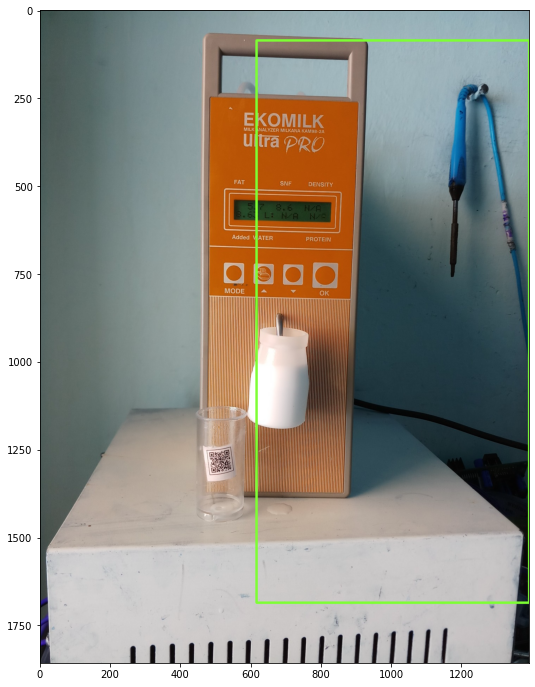

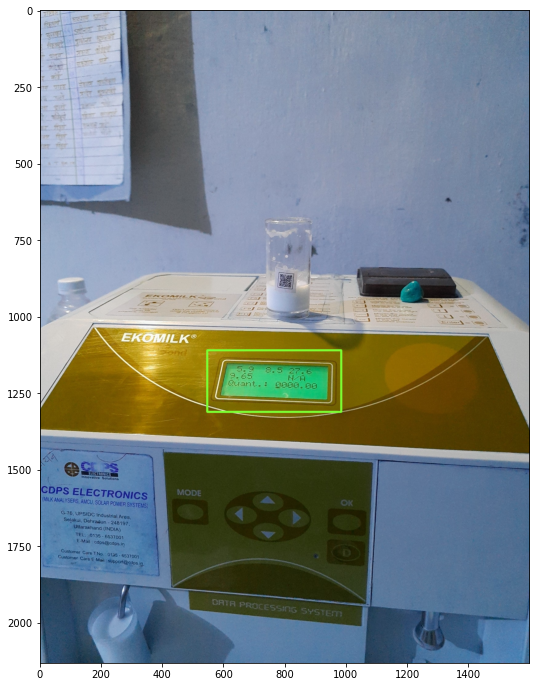

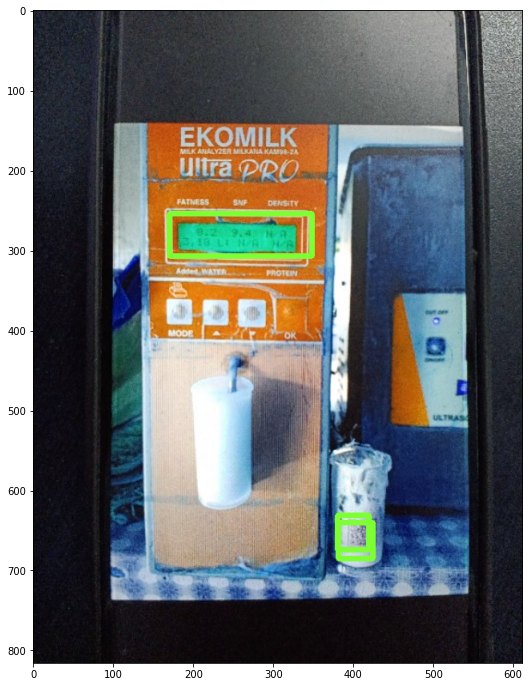

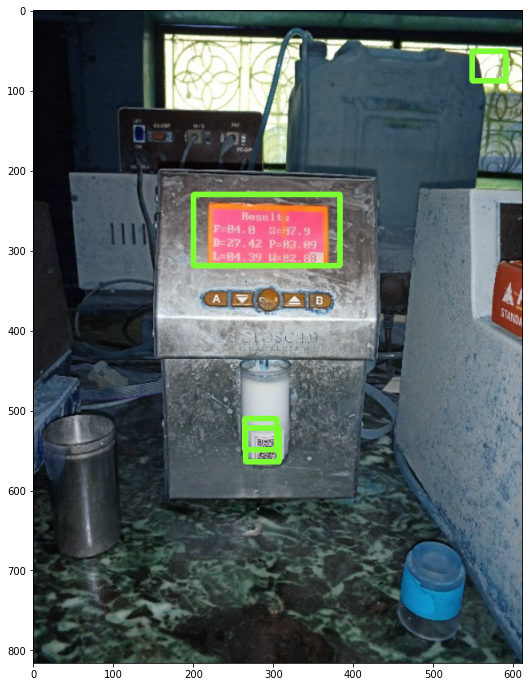

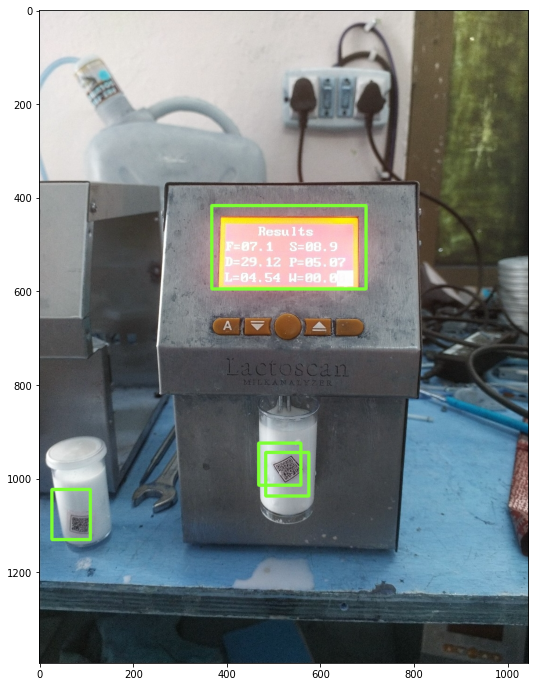

...

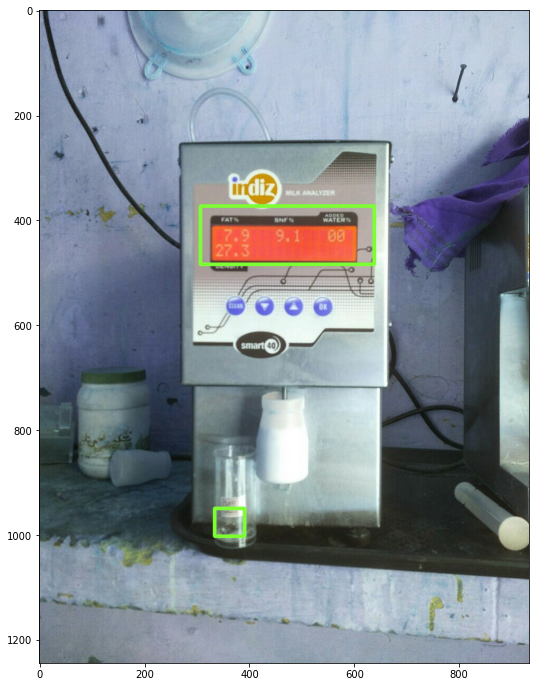

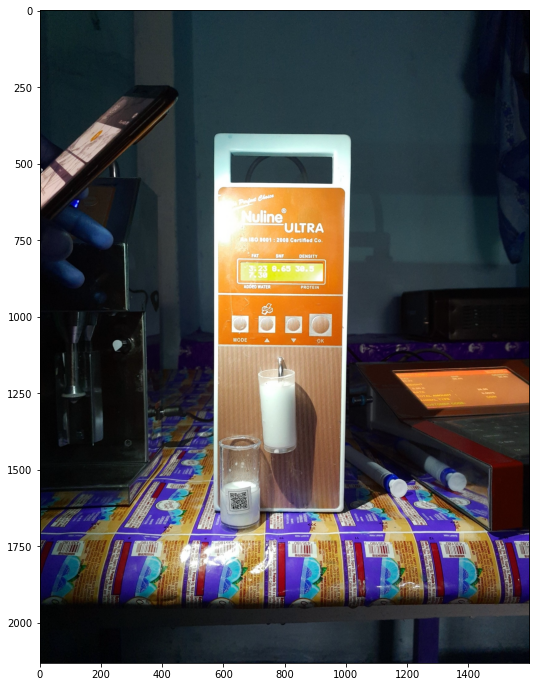

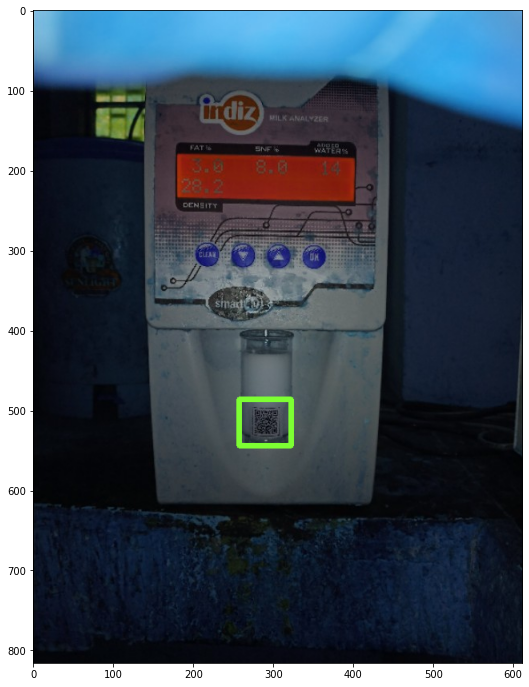

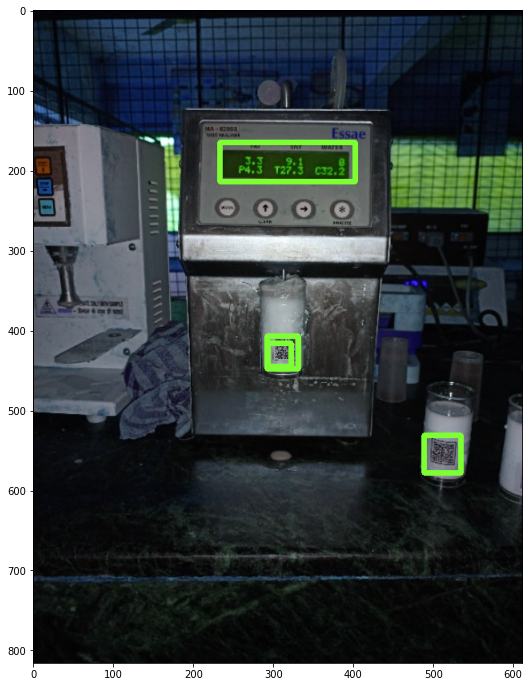

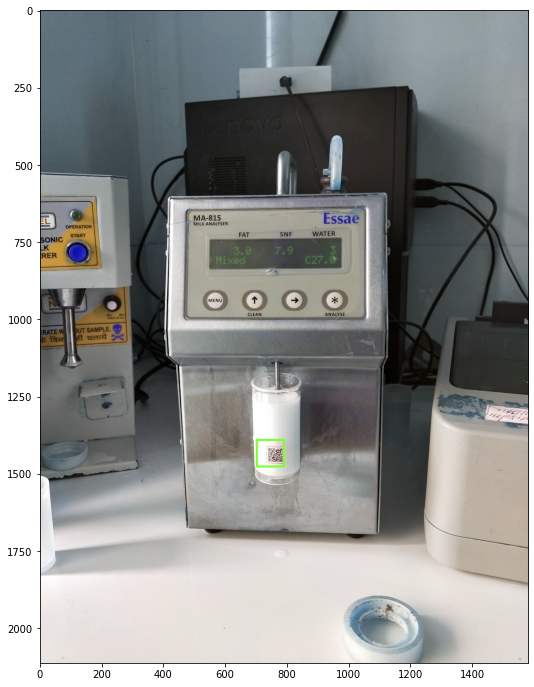

In [0]:
import os
import numpy as np
import tensorflow as tf
import cv2 as cv
from matplotlib import pyplot as plt
%matplotlib inline

# Read the graph.
with tf.gfile.FastGFile('/content/frozen_inference_graph (1).pb', 'rb') as f:
  graph_def = tf.GraphDef()
  graph_def.ParseFromString(f.read())

with tf.Session() as sess:
# Restore session
  sess.graph.as_default()
  tf.import_graph_def(graph_def, name='')

  # Read and preprocess an image.
  for file in os.listdir('/content/models/research/train/')[1:]:
    img = cv.imread('/content/models/research/train/'+file)
    rows = img.shape[0]
    cols = img.shape[1]
    inp = cv.resize(img, (300, 300))
    inp = inp[:, :, [2, 1, 0]] # BGR2RGB

    # Run the model
    out = sess.run([sess.graph.get_tensor_by_name('num_detections:0'),
    sess.graph.get_tensor_by_name('detection_scores:0'),
    sess.graph.get_tensor_by_name('detection_boxes:0'),
    sess.graph.get_tensor_by_name('detection_classes:0')],
    feed_dict={'image_tensor:0': inp.reshape(1, inp.shape[0], inp.shape[1], 3)})

    # Visualize detected bounding boxes.'
    num_detections = int(out[0][0])
    for i in range(num_detections):
      classId = int(out[3][0][i])
      score = float(out[1][0][i])
      print(score)
      bbox = [float(v) for v in out[2][0][i]]
      if score > 0.6:
        x = bbox[1] * cols
        y = bbox[0] * rows
        right = bbox[3] * cols
        bottom = bbox[2] * rows
        cv.rectangle(img, (int(x), int(y)), (int(right), int(bottom)), (125, 255, 51), thickness=6)
        
    plt.figure(figsize=(16, 12))
    plt.imshow(img)

In [0]:
!python TFLite_detection_image.py --modeldir=/content/models/research/tflite --image=/content/models/research/train/eb088596-c8bc-4e4f-b6cc-1e27ac40f9f3.jpg

: cannot connect to X server 


In [0]:
!git clone https://github.com/QuantuMobileSoftware/mobile_detector.git

Cloning into 'mobile_detector'...
remote: Enumerating objects: 202, done.
remote: Total 202 (delta 0), reused 0 (delta 0), pack-reused 202
Receiving objects: 100% (202/202), 55.03 MiB | 42.40 MiB/s, done.
Resolving deltas: 100% (107/107), done.


In [0]:
cd mobile_detector

/content/models/research/mobile_detector


In [0]:
import numpy as np
import tensorflow as tf
import cv2

from object_detector_detection_api import ObjectDetectorDetectionAPI, \
    PATH_TO_LABELS, NUM_CLASSES


class ObjectDetectorLite(ObjectDetectorDetectionAPI):
    def __init__(self, model_path='detect.tflite'):
        """
            Builds Tensorflow graph, load model and labels
        """

        # Load lebel_map
        self._load_label(PATH_TO_LABELS, NUM_CLASSES, use_disp_name=True)

        # Define lite graph and Load Tensorflow Lite model into memory
        self.interpreter = tf.lite.Interpreter(
            model_path=model_path)
        self.interpreter.allocate_tensors()
        self.input_details = self.interpreter.get_input_details()
        self.output_details = self.interpreter.get_output_details()

    def detect(self, image, threshold=0.1):
        """
            Predicts person in frame with threshold level of confidence
            Returns list with top-left, bottom-right coordinates and list with labels, confidence in %
        """

        # Resize and normalize image for network input
        frame = cv2.resize(image, (300, 300))
        frame = np.expand_dims(frame, axis=0)
        frame = (2.0 / 255.0) * frame - 1.0
        frame = frame.astype('float32')

        # run model
        self.interpreter.set_tensor(self.input_details[0]['index'], frame)
        self.interpreter.invoke()

        # get results
        boxes = self.interpreter.get_tensor(
            self.output_details[0]['index'])
        classes = self.interpreter.get_tensor(
            self.output_details[1]['index'])
        scores = self.interpreter.get_tensor(
            self.output_details[2]['index'])
        num = self.interpreter.get_tensor(
            self.output_details[3]['index'])

        # Find detected boxes coordinates
        return self._boxes_coordinates(image,
                            np.squeeze(boxes[0]),
                            np.squeeze(classes[0]+1).astype(np.int32),
                            np.squeeze(scores[0]),
                            min_score_thresh=threshold)

    def close(self):
        pass


if __name__ == '__main__':
    detector = ObjectDetectorLite()

    image = cv2.cvtColor(cv2.imread('/content/models/research/train/ed239122-f1f1-4fe7-a0e3-8fc6166e261c.jpg'), cv2.COLOR_BGR2RGB)

    result = detector.detect(image, 0.4)
    print(result)

    for obj in result:
        print('coordinates: {} {}. class: "{}". confidence: {:.2f}'.
                    format(obj[0], obj[1], obj[3], obj[2]))

        cv2.rectangle(image, obj[0], obj[1], (0, 255, 0), 2)
        cv2.putText(image, '{}: {:.2f}'.format(obj[3], obj[2]),
                    (obj[0][0], obj[0][1] - 5),
                    cv2.FONT_HERSHEY_PLAIN, 1, (0, 255, 0), 2)

    cv2.imwrite('r1.jpg', cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    detector.close()

[]


In [0]:
import tensorflow as tf 
import numpy as np
import cv2

interpreter = tf.lite.Interpreter(model_path="/content/model.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print(input_details)
print(output_details)
print()

input_shape = input_details[0]['shape']
im = cv2.imread("/content/eb088596-c8bc-4e4f-b6cc-1e27ac40f9f3.jpg")
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im_rgb = cv2.resize(im_rgb, (input_shape[1], input_shape[2]))
input_data = np.expand_dims(im_rgb, axis=0)
print(input_data.shape)
print()


detection_boxes = interpreter.get_tensor(output_details[0]['index'])
detection_classes = interpreter.get_tensor(output_details[1]['index'])
detection_scores = interpreter.get_tensor(output_details[2]['index'])
num_boxes = interpreter.get_tensor(output_details[3]['index'])
print(num_boxes)
for i in range(int(num_boxes[0])):
  if detection_scores[0, i] > .2:
       class_id = detection_classes[0, i]
       print('class_id',class_id)

[{'name': 'normalized_input_image_tensor', 'index': 383, 'shape': array([  1, 320, 320,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0)}]
[{'name': 'TFLite_Detection_PostProcess', 'index': 375, 'shape': array([ 1, 10,  4], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0)}, {'name': 'TFLite_Detection_PostProcess:1', 'index': 376, 'shape': array([ 1, 10], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0)}, {'name': 'TFLite_Detection_PostProcess:2', 'index': 377, 'shape': array([ 1, 10], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0)}, {'name': 'TFLite_Detection_PostProcess:3', 'index': 378, 'shape': array([1], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0)}]

(1, 320, 320, 3)

[2.1702645e-18]


In [0]:
!pip install ISR

     |████████████████████████████████| 86.3MB 36kB/s 
     |████████████████████████████████| 450kB 36.5MB/s 
     |████████████████████████████████| 3.8MB 42.0MB/s 
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow~=2.1.0, but you'll have tensorflow 2.0.0 which is incompatible.
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow-addons~=0.7.0, but you'll have tensorflow-addons 0.8.3 which is incompatible.
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0
  Found existing installation: tensorflow 1.15.0
    Uninstalling tensorflow-1.15.0:
      Successfully uninstalled tensorflow-1.15.0


In [0]:
import numpy as np
from PIL import Image

img = Image.open('/content/0c4cdc24-e3e1-4e6e-ada1-b08d719109a1.jpg')
lr_img = np.array(img)

10698752/10694096 [==============================] - 1s 0us/step


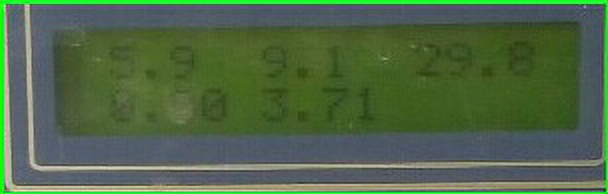

In [0]:
from ISR.models import RDN

rdn = RDN(weights='psnr-small')
sr_img = rdn.predict(lr_img)
Image.fromarray(sr_img)

In [0]:
import numpy as np
import tensorflow as tf
import cv2

# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="converted_model.tflite")
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test model on random input data.
input_shape = input_details[0]['shape']
# input_data = np.array(lr_img.reshape(1,lr_img.shape[0],lr_img.shape[1],3), dtype=np.float32)
input_data = cv2.resize(lr_img, (input_shape[1], input_shape[2]))
input_data = np.array(input_data.reshape(1,input_data.shape[0],input_data.shape[1],3), dtype=np.float32)
interpreter.set_tensor(input_details[0]['index'], input_data)

interpreter.invoke()

# The function `get_tensor()` returns a copy of the tensor data.
# Use `tensor()` in order to get a pointer to the tensor.
output_data = interpreter.get_tensor(output_details[0]['index'])
print(output_data)
Image.fromarray(output_data)

[[[[ 0.04533917  0.2919972   0.23486897]
   [-0.11178278  0.5162596  -0.35460532]
   [-0.19650877  1.0239973  -0.51923126]
   ...
   [-0.5595347   0.34910482 -0.33330214]
   [-0.54778767 -0.11121108 -0.41343892]
   [-0.10721559 -0.36775896  0.01154818]]

  [[ 0.14933987  0.45022446 -0.05318289]
   [-0.22855924  0.5793896  -0.51353455]
   [-0.4260304   0.91595757 -0.74275136]
   ...
   [-1.0379157   0.5038292   0.22404084]
   [-0.9166081   0.12834185  0.1966081 ]
   [-0.3280387  -0.14972058  0.30736324]]

  [[ 0.21860462  0.12589817  0.13639973]
   [-0.31398755  0.18493879  0.14676732]
   [-0.40213957  0.18147284  0.00994042]
   ...
   [-0.90261066  0.1112844   0.43176225]
   [-0.83318377  0.08890387  0.29797333]
   [-0.08117199 -0.48081908  0.7704923 ]]

  ...

  [[ 0.00411165  0.39868873  0.02611172]
   [-0.6235819   0.2029852  -0.04431286]
   [-0.73240423  0.1529153  -0.2741583 ]
   ...
   [-0.00518887  0.350567   -0.7291361 ]
   [-0.4261297   0.66452944 -0.81688046]
   [-0.3454073  

TypeError: ignored

In [0]:
import tensorflow as tf

# model = tf.keras.models.('/content/rdn-C3-D10-G64-G064-x2_PSNR_epoch134.hdf5')
converter = tf.lite.TFLiteConverter.from_keras_model(rdn.model)
tflite_model = converter.convert()z
open("converted_model.tflite", "wb").write(tflite_model)

ValueError: ignored

In [0]:
rdn.model.summary()

Model: "generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
LR (InputLayer)                 [(None, None, None,  0                                            
__________________________________________________________________________________________________
F_m1 (Conv2D)                   (None, None, None, 6 1792        LR[0][0]                         
__________________________________________________________________________________________________
F_0 (Conv2D)                    (None, None, None, 6 36928       F_m1[0][0]                       
__________________________________________________________________________________________________
F_1_1 (Conv2D)                  (None, None, None, 6 36928       F_0[0][0]                        
__________________________________________________________________________________________

In [0]:
from keras.layers import Input

In [0]:
old = rdn.model

In [0]:
model_config = old.get_config()

In [0]:
input_layer_name = model_config['layers'][0]['name']
input_layer_name

'LR'

In [0]:
model_config['layers'][0] = {
                      'name': 'LR',
                      'class_name': 'InputLayer',
                      'config': {
                          'batch_input_shape': (1, 300, 300,3),
                          'dtype': 'float32',
                          'sparse': False,
                          'name': 'LR'
                      },
                      'inbound_nodes': []
                  }
model_config['layers'][1]['inbound_nodes'] = [[['LR', 0, 0, {}]]]
model_config['input_layers'] = [['LR', 0, 0]]

In [0]:
new_model = old.__class__.from_config(model_config, custom_objects={})

In [0]:
new_model.summary()

Model: "generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
LR (InputLayer)                 [(None, 300, 300, 3) 0                                            
__________________________________________________________________________________________________
F_m1 (Conv2D)                   (None, 300, 300, 64) 1792        LR[0][0]                         
__________________________________________________________________________________________________
F_0 (Conv2D)                    (None, 300, 300, 64) 36928       F_m1[0][0]                       
__________________________________________________________________________________________________
F_1_1 (Conv2D)                  (None, 300, 300, 64) 36928       F_0[0][0]                        
__________________________________________________________________________________________

In [0]:
converter = tf.lite.TFLiteConverter.from_keras_model(new_model)
tflite_model = converter.convert()
open("converted_model.tflite", "wb").write(tflite_model)

10488352

In [0]:
import imageio
imageio.imwrite

<function imageio.core.functions.imwrite>

In [0]:
!pip install tensorflow==1.14.0

     |████████████████████████████████| 109.2MB 28kB/s 
     |████████████████████████████████| 491kB 39.1MB/s 
     |████████████████████████████████| 3.2MB 48.0MB/s 
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow~=2.1.0, but you'll have tensorflow 1.14.0 which is incompatible.
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow-addons~=0.7.0, but you'll have tensorflow-addons 0.8.3 which is incompatible.
ERROR: isr 2.2.0 has requirement tensorflow==2.0.0, but you'll have tensorflow 1.14.0 which is incompatible.
  Found existing installation: tensorflow-estimator 2.1.0
    Uninstalling tensorflow-estimator-2.1.0:
      Successfully uninstalled tensorflow-estimator-2.1.0
  Found existing installation: tensorboard 2.1.1
    Uninstalling tensorboard-2.1.1:
      Successfully uninstalled tensorboard-2.1.1
  Found existing installation: tensorflow 2.1.0
    Uninstalling tensorflow-2.1.0:
      Successfully uninstalled tensorflow-2.1.0


In [0]:
cd Image-Super-Resolution

/content/Image-Super-Resolution


In [0]:
!python main.py "/content/0c4cdc24-e3e1-4e6e-ada1-b08d719109a1.jpg" --model="sr"

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [0]:
!tar -xf /content/super-resolution/weights-edsr-16-x4.tar.gz

In [0]:
!pip install tensorflow-gpu==2.0.0

     |████████████████████████████████| 380.8MB 42kB/s 
     |████████████████████████████████| 450kB 62.4MB/s 
     |████████████████████████████████| 3.8MB 65.3MB/s 
ERROR: tensorflow 1.15.0 has requirement tensorboard<1.16.0,>=1.15.0, but you'll have tensorboard 2.0.2 which is incompatible.
ERROR: tensorflow 1.15.0 has requirement tensorflow-estimator==1.15.1, but you'll have tensorflow-estimator 2.0.1 which is incompatible.
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow~=2.1.0, but you'll have tensorflow 1.15.0 which is incompatible.
ERROR: tensorflow-federated 0.12.0 has requirement tensorflow-addons~=0.7.0, but you'll have tensorflow-addons 0.8.3 which is incompatible.
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0


In [0]:
cd /content/super-resolution/

/content/super-resolution


In [0]:
%tensorflow_version 2.x

In [0]:
from keras.models import load_model
import tensorflow as tf
# m = load_model('sr.h5')
import tensorflow as tf
print(tf.__version__)

model = tf.keras.models.load_model('sr.h5',custom_objects={'tf': tf})

2.0.0


/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/keras/layers/core.py:901: UserWarning: model.common is not loaded, but a Lambda layer uses it. It may cause errors.
  , UserWarning)


In [0]:
model.save('sr.h5')

In [0]:
import numpy as np
import tensorflow as tf
from PIL import Image

def resolve_single(model, lr):
    return resolve(model, tf.expand_dims(lr, axis=0))[0]


def resolve(model, lr_batch):
    lr_batch = tf.cast(lr_batch, tf.float32)
    sr_batch = model(lr_batch)
    sr_batch = tf.clip_by_value(sr_batch, 0, 255)
    sr_batch = tf.round(sr_batch)
    sr_batch = tf.cast(sr_batch, tf.uint8)
    return sr_batch

def load_image(path):
    return np.array(Image.open(path),dtype=np.uint8)

In [0]:
# from model import resolve_single
# from model.edsr import edsr

# from utils import plot_sample

# model = edsr(scale=4, num_res_blocks=16)
# model.load_weights('weights/edsr-16-x4/weights.h5')

lr = load_image('/content/0c4cdc24-e3e1-4e6e-ada1-b08d719109a1.jpg')
sr = resolve_single(model, lr)

# plot_sample(lr, sr)

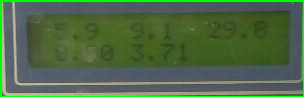

In [0]:
Image.fromarray(lr)

In [0]:
import cv2
cv2.imwrite('new.jpg',sr.numpy())


True

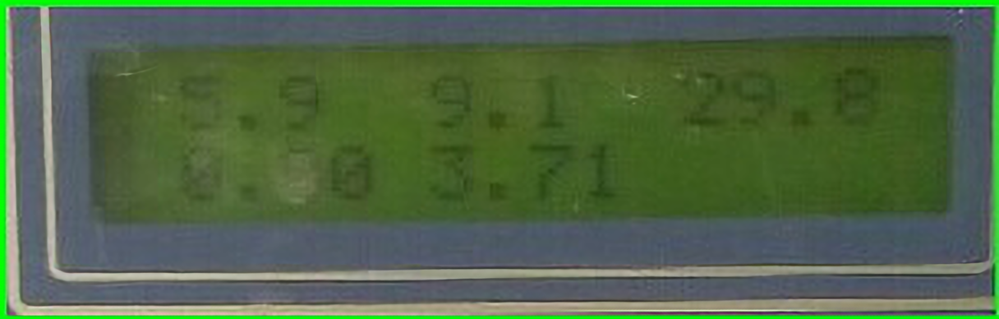

In [0]:
Image.fromarray(sr.numpy())

In [0]:
from matplotlib import pyplot as plt
%matplotlib inline

In [0]:
tf.InteractiveSession()
# import tensorflow as tf
# import PIL


# with tf.Session() as sess:
#     # display encoded back to image data
#     print(sr.eval())

In [0]:
import tensorflow as tf
tf.__version__

'2.0.0'

In [0]:
cd ..

/content


In [0]:
!git clone https://github.com/payne911/SR-ResCNN-Keras-.git

Cloning into 'SR-ResCNN-Keras-'...
remote: Enumerating objects: 628, done.
remote: Total 628 (delta 0), reused 0 (delta 0), pack-reused 628
Receiving objects: 100% (628/628), 868.32 MiB | 46.79 MiB/s, done.
Resolving deltas: 100% (337/337), done.
Checking out files: 100% (113/113), done.


In [0]:
!python demo.py --arc=esrgan --lr_path=/content/0c4cdc24-e3e1-4e6e-ada1-b08d719109a1.jpg --save_dir=/content/output --model_path=/content/Keras-Image-Super-Resolution/checkpoints/esrgan-10.h5 --cuda=0


Instructions for updating:
If using Keras pass *_constraint arguments to layers.

** Loading model at: /content/Keras-Image-Super-Resolution/checkpoints/esrgan-10.h5


Save a sr image at /content/output/0c4cdc24-e3e1-4e6e-ada1-b08d719109a1.jpg


In [0]:
cd /content/Keras-Image-Super-Resolution

/content/Keras-Image-Super-Resolution


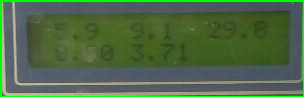

In [0]:
from ISR.models import RDN

rdn = RDN(weights='psnr-small')
lr = load_image('/content/0c4cdc24-e3e1-4e6e-ada1-b08d719109a1.jpg')
sr_img = rdn.predict(lr)
Image.fromarray(lr)


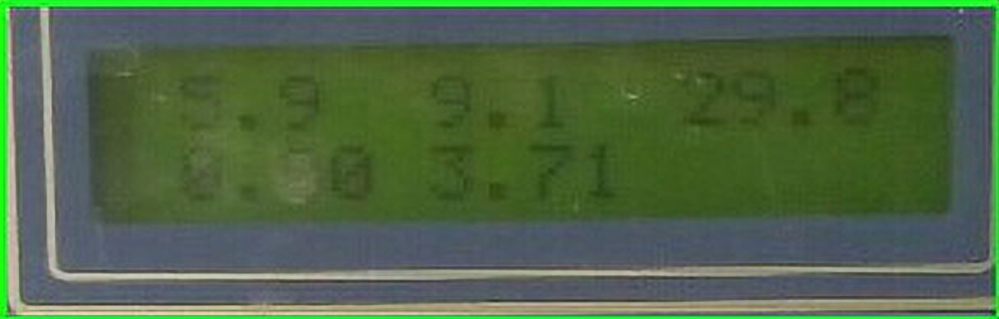

In [0]:
import cv2
cv2.imwrite('sr.jpg',sr_img)
Image.fromarray(sr_img)

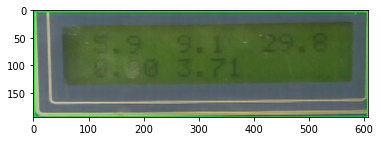

In [0]:
plt.imshow(sr_img)

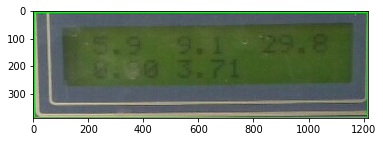

In [0]:
plt.imshow(sr_img)